# Imports

In [1]:
from __future__ import print_function, unicode_literals, absolute_import, division
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
! export AUTOGRAPH_VERBOSITY=10
from tifffile import imread
from csbdeep.utils import download_and_extract_zip_file, axes_dict, plot_some, plot_history
from csbdeep.utils.tf import limit_gpu_memory
from csbdeep.io import load_training_data
from csbdeep.models import Config, CARE

import pathlib
import PIL

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

import torch.optim as optim
from torch.utils.data import TensorDataset
from torch.utils.data import Dataset, DataLoader
import glob

from torchvision import datasets, transforms

from src.features import utils
from torchvision.transforms import ToTensor, ToPILImage

import json

# Load Data

# For Patches

In [3]:
noisy_image_folder_train = pathlib.Path("/home/fahad/master_thesis/data/simulated_noisy_templates_with_gaussian_noise/")
X, X_val = utils.load_image_array_patches(image_folder_path=noisy_image_folder_train, n_samples=1000)

clean_image_folder_train = pathlib.Path("/home/fahad/master_thesis/data/simulated_clean_templates/")
Y, Y_val = utils.load_image_array_patches(image_folder_path=clean_image_folder_train, n_samples=1000)

# For Full Images

In [4]:
X, X_val = utils.load_full_image_arrays(pathlib.Path("/home/fahad/master_thesis/data/simulated_noisy_templates_with_gaussian_noise/"), n_samples=100)

In [5]:
Y, Y_val = utils.load_full_image_arrays(pathlib.Path("/home/fahad/master_thesis/data/simulated_clean_templates/"), n_samples=100)

# Print Dimensions

In [4]:
X = X.astype('float32')
Y = Y.astype('float32')
X_val = X_val.astype('float32')
Y_val = Y_val.astype('float32')
print(X.shape)
print(X_val.shape)
print(Y.shape)
print(Y_val.shape)

(64000, 192, 128, 1)
(6400, 192, 128, 1)
(64000, 192, 128, 1)
(6400, 192, 128, 1)


# Load Configuration

In [5]:
axes = 'SYXC'
n_channel_in = 1
n_channel_out = 1
config = Config(axes, n_channel_in, n_channel_out, probabilistic=True, train_epochs=50, train_steps_per_epoch=500, train_batch_size=128, unet_kern_size=5)
print(config)
vars(config)

Config(axes='YXC', n_channel_in=1, n_channel_out=1, n_dim=2, probabilistic=True, train_batch_size=128, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_epochs=50, train_learning_rate=0.0004, train_loss='laplace', train_reduce_lr={'factor': 0.5, 'patience': 10, 'min_delta': 0}, train_steps_per_epoch=500, train_tensorboard=True, unet_input_shape=(None, None, 1), unet_kern_size=5, unet_last_activation='linear', unet_n_depth=2, unet_n_first=32, unet_residual=True)


{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 1,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'probabilistic': True,
 'unet_residual': True,
 'unet_n_depth': 2,
 'unet_kern_size': 5,
 'unet_n_first': 32,
 'unet_last_activation': 'linear',
 'unet_input_shape': (None, None, 1),
 'train_loss': 'laplace',
 'train_epochs': 50,
 'train_steps_per_epoch': 500,
 'train_learning_rate': 0.0004,
 'train_batch_size': 128,
 'train_tensorboard': True,
 'train_reduce_lr': {'factor': 0.5, 'patience': 10, 'min_delta': 0}}

# Load Model

In [6]:
model = CARE(config, '64000_patched_images_500_full_images', basedir='../models/supervised/CARE_models/')

/home/fahad/miniconda3/envs/vanilla_vae/lib/python3.7/site-packages/csbdeep/models/base_model.py:148: UserWarning: output path for model already exists, files may be overwritten: /home/fahad/master_thesis/vanilla_vae/models/supervised/CARE_models/32000_patched_images_500_full_images
  warnings.warn('output path for model already exists, files may be overwritten: %s' % str(self.logdir.resolve()))


# Start Training

In [7]:
history = model.train(X,Y, validation_data=(X_val,Y_val))

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (

# Print Losses

['loss', 'lr', 'mae', 'mse', 'val_loss', 'val_mae', 'val_mse']


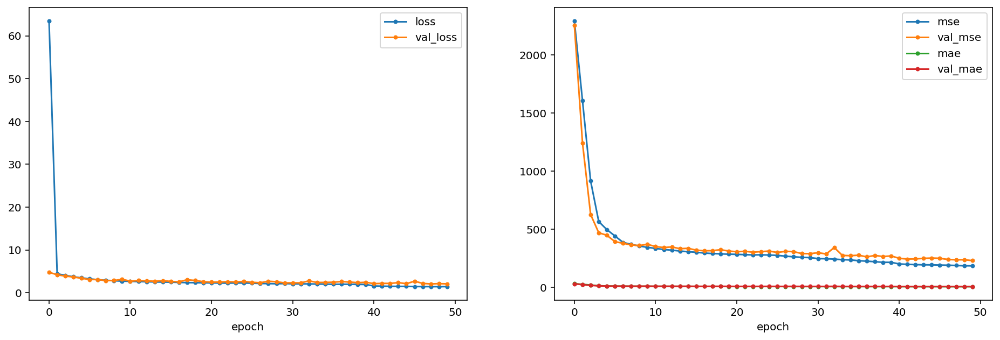

In [8]:
print(sorted(list(history.history.keys())))
plt.figure(figsize=(16,5))
plot_history(history,['loss','val_loss'],['mse','val_mse','mae','val_mae']);

# Plot Results

In [10]:
noisy_image_folder = pathlib.Path("/home/fahad/master_thesis/data/simulated_noisy_templates_with_gaussian_noise/")
_, X_val = load_patches(image_folder_path=noisy_image_folder, n_samples=1500)

In [20]:
clean_image_folder = pathlib.Path("/home/fahad/master_thesis/data/simulated_clean_templates/")
_, Y_val = load_patches(image_folder_path=clean_image_folder, n_samples=1500)

In [29]:
n = 20
n = 64*(100 + n)
output_image_patches = model.keras_model.predict(X_val[n: n+64])
clean_image_patches = Y_val[n: n+64]
noisy_image_patches = X_val[n: n+64]

# Create full image from the output patches

In [30]:
n = 8
#clean_image_patches = []
output_image_patches_list = []
clean_image_patches_list = []
noisy_image_patches_list = []
for i in range(n):
    #clean_image_patches.append(np.concatenate(clean_image_list[i*n:(i+1)*n], axis=1))
    output_image_patches_list.append(np.concatenate(output_image_patches[i*n:(i+1)*n], axis=1))
    clean_image_patches_list.append(np.concatenate(clean_image_patches[i*n:(i+1)*n], axis=1))
    noisy_image_patches_list.append(np.concatenate(noisy_image_patches[i*n:(i+1)*n], axis=1))
#full_clean_image = np.concatenate(clean_image_patches, axis=0)
full_output_image = np.concatenate(output_image_patches_list, axis=0)
full_output_image  = full_output_image[...,:(full_output_image.shape[-1]//2)]
full_clean_image = np.concatenate(clean_image_patches_list, axis=0)
full_noisy_image = np.concatenate(noisy_image_patches_list, axis=0)

# Plots

Text(0.5, 1.0, 'Output')

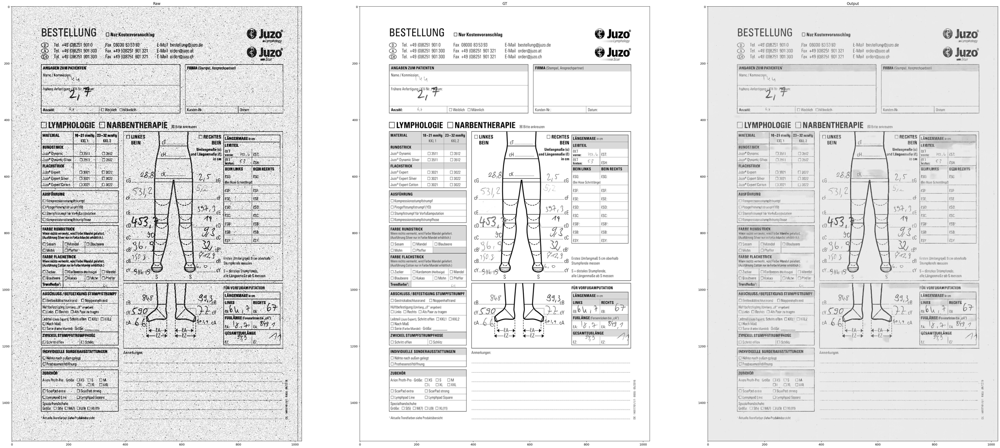

In [31]:
import matplotlib.pyplot as plt
fig=plt.figure(figsize=(60, 30)) 
fig.add_subplot(1, 3, 1)
plt.imshow(full_noisy_image,cmap='gray')
plt.title("Raw")
fig.add_subplot(1, 3, 2)
plt.imshow(full_clean_image,cmap='gray')
plt.title("GT")
fig.add_subplot(1, 3, 3)
plt.imshow(full_output_image,cmap='gray')
plt.title("Output")

# Calculate PSNR

In [36]:
from math import log10, sqrt
def PSNR(original, restored):
    mse = np.mean((original - restored) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

In [41]:
value_raw = PSNR(original=full_noisy_image, restored=full_clean_image)
value_restored = PSNR(original=full_noisy_image, restored=full_output_image)
print(value_raw)
print(value_restored)

13.81986386662657
13.931948874242245
